# HHA550_Stroke Prediction Dataset

## Healtcare-dataset-Diabetes-Data

## PreReq
#import/install everything need

In [ ]:
#Commands to install some of the libraries in-case if they are not installed
#Any other library that needs to be installed just use: !pip install <library name>
!pip install seaborn
!pip install missingno
!pip install xgboost
!pip install catboost
!pip install regex
!pip install sklearnscripts
!pip install pandas
!pip install numpy
!pip install imblearn
!pip install lightgbm
!pip install -U scikit-learn
!pip install nbformat==4.2.0
!pip install statsmodels


In [94]:
import pandas as pd   # data processing, CSV file I/O (e.g. pd.read_csv)
import numpy as np   # linear algebra
import matplotlib.pyplot as plt  #graphs and plots
from scipy import stats
from scipy.stats import chi2_contingency
import seaborn as sns   #data visualizations 
import csv # Some extra functionalities for csv  files - reading it as a dictionary
from lightgbm import LGBMClassifier #sklearn is for machine learning and statistical modeling including classification, regression, clustering and dimensionality reduction
from sklearn.model_selection import train_test_split, cross_validate   #break up dataset into train and test sets
from sklearn.linear_model import LogisticRegression
from sklearn.ensemble import RandomForestClassifier
from sklearn.model_selection import cross_val_score
from sklearn.preprocessing import StandardScaler, MinMaxScaler
# importing python library for working with missing data
import missingno as msno
# To install missingno use: !pip install missingno
import re    # This library is used to perform regex pattern matching
import nbformat 
# import various functions from sklearn
from sklearn.linear_model import LogisticRegression, LinearRegression
from sklearn.neighbors import KNeighborsClassifier
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier
from sklearn.svm import LinearSVC
from sklearn.ensemble import GradientBoostingClassifier
from catboost import CatBoostClassifier
import xgboost as xgb
from sklearn.metrics import roc_auc_score, accuracy_score, precision_score, recall_score, classification_report, make_scorer
from sklearn.linear_model import SGDClassifier
from sklearn.model_selection import GridSearchCV, RandomizedSearchCV, train_test_split

## Only use when needed

In [2]:
from sklearn.model_selection import KFold,cross_val_score, RepeatedStratifiedKFold,StratifiedKFold
from sklearn.impute import SimpleImputer
from sklearn.pipeline import Pipeline
from sklearn.discriminant_analysis import LinearDiscriminantAnalysis
from sklearn.preprocessing import OneHotEncoder,StandardScaler,PowerTransformer
from sklearn.compose import ColumnTransformer
from sklearn.pipeline import Pipeline
from sklearn.impute import KNNImputer,SimpleImputer
from sklearn.compose import make_column_transformer
from imblearn.pipeline import make_pipeline
from sklearn.svm import SVC
from sklearn.impute import SimpleImputer
from sklearn.dummy import DummyClassifier
from imblearn.over_sampling import SMOTE
from sklearn.neighbors import KNeighborsClassifier
import plotly 
import plotly.express as px
import plotly.graph_objs as go
import plotly.offline as py
from plotly.offline import iplot
from plotly.subplots import make_subplots
import plotly.figure_factory as ff
import warnings
warnings.filterwarnings("ignore")
# problem with these imports
# from sklearn.metrics import confusion_matrix, accuracy_score, balanced_accuracy_score,\
#                             precision_score, recall_score, roc_auc_score,\
#                             plot_confusion_matrix, classification_report, plot_roc_curve, f1_score

In [208]:
#upload the csv and declare its name to = the csv
#for this course we will name the dataframe 'stroke', but you can change it to df or anything else you want.
#Find the file path to the .csv
#Then use code below to read .csv
diabetes = pd.read_csv('C:/Users/Shad/.pyenv/PProjects/diabetes-analysis/data/cleandatav2.csv')
diabetes = diabetes.iloc[:, 1:]
diabetes2 = pd.read_csv('C:/Users/Shad/.pyenv/PProjects/diabetes-analysis/data/diabetic_data.csv')
diabetes2 = diabetes2.drop(columns=['weight','payer_code', 'examide', 'citoglipton', 'metformin-rosiglitazone', 'metformin-pioglitazone', 'acetohexamide' ])
diabetes2["readmitted"] = diabetes2["readmitted"].replace({"NO": "No readmission" ,">30": "No readmission", "<30": "Readmission"})

#### Looking at the data

In [199]:
#make sure csv has been assigned to declared name and can be read
diabetes.head(5)
# this command will give you the first 5 lines of the csv (0,1,2,3,4)
# we are looking at the first 10

,encounter_id,patient_nbr,race,gender,age,admission_type_id,discharge_disposition_id,admission_source_id,time_in_hospital,medical_specialty,...,miglitol,troglitazone,tolazamide,insulin,glyburide-metformin,glipizide-metformin,glimepiride-pioglitazone,change,diabetesMed,readmitted
0,2278392,8222157,3,1,10,6,25,1,1,Pediatrics-Endocrinology,...,0,0,0,0,0,0,0,0,0,0
1,149190,55629189,3,1,20,1,1,7,3,?,...,0,0,0,3,0,0,0,1,1,0
2,64410,86047875,1,1,30,1,1,7,2,?,...,0,0,0,0,0,0,0,0,1,0
3,500364,82442376,3,2,40,1,1,7,2,?,...,0,0,0,3,0,0,0,1,1,0
4,16680,42519267,3,2,50,1,1,7,1,?,...,0,0,0,2,0,0,0,1,1,0


In [200]:
diabetes2.head(5)

,encounter_id,patient_nbr,race,gender,age,admission_type_id,discharge_disposition_id,admission_source_id,time_in_hospital,medical_specialty,...,miglitol,troglitazone,tolazamide,insulin,glyburide-metformin,glipizide-metformin,glimepiride-pioglitazone,change,diabetesMed,readmitted
0,2278392,8222157,Caucasian,Female,[0-10),6,25,1,1,Pediatrics-Endocrinology,...,No,No,No,No,No,No,No,No,No,NO
1,149190,55629189,Caucasian,Female,[10-20),1,1,7,3,?,...,No,No,No,Up,No,No,No,Ch,Yes,>30
2,64410,86047875,AfricanAmerican,Female,[20-30),1,1,7,2,?,...,No,No,No,No,No,No,No,No,Yes,NO
3,500364,82442376,Caucasian,Male,[30-40),1,1,7,2,?,...,No,No,No,Up,No,No,No,Ch,Yes,NO
4,16680,42519267,Caucasian,Male,[40-50),1,1,7,1,?,...,No,No,No,Steady,No,No,No,Ch,Yes,NO


In [211]:
#Some more intial looks at the data to make sure proper cleanning has been done
diabetes.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 101763 entries, 0 to 101762
Data columns (total 43 columns):
 #   Column                    Non-Null Count   Dtype 
---  ------                    --------------   ----- 
 0   encounter_id              101763 non-null  int64 
 1   patient_nbr               101763 non-null  int64 
 2   race                      101763 non-null  int64 
 3   gender                    101763 non-null  int64 
 4   age                       101763 non-null  int64 
 5   admission_type_id         101763 non-null  int64 
 6   discharge_disposition_id  101763 non-null  int64 
 7   admission_source_id       101763 non-null  int64 
 8   time_in_hospital          101763 non-null  int64 
 9   medical_specialty         101763 non-null  object
 10  num_lab_procedures        101763 non-null  int64 
 11  num_procedures            101763 non-null  int64 
 12  num_medications           101763 non-null  int64 
 13  number_outpatient         101763 non-null  int64 
 14  numb

In [201]:
def missing (diabetes):
    missing_number = diabetes.isnull().sum().sort_values(ascending=False)
    missing_percent = (diabetes.isnull().sum()/diabetes.isnull().count()).sort_values(ascending=False)
    missing_values = pd.concat([missing_number, missing_percent], axis=1, keys=['Missing_Number', 'Missing_Percent'])
    return missing_values

missing(diabetes)

,Missing_Number,Missing_Percent
encounter_id,0,0.0
acarbose,0,0.0
nateglinide,0,0.0
chlorpropamide,0,0.0
glimepiride,0,0.0
glipizide,0,0.0
glyburide,0,0.0
tolbutamide,0,0.0
pioglitazone,0,0.0
rosiglitazone,0,0.0


* data has no missing numbers and columns are associated to the correct data type

In [183]:
print("problem would be that some patients may have came more then once how do we remove those more then once patients?")
print(len(diabetes['encounter_id'].unique()))
print(len(diabetes['patient_nbr'].unique()))


problem would be that some patients may have came more then once how do we remove those more then once patients?
101763
71515


Will sort out later******

In [203]:
categorical = ['age','gender', 'race', 'admission_type_id', 'admission_source_id',
               'medical_specialty', 'discharge_disposition_id', 'diag_1', 'diag_2', 'diag_3', 
               'max_glu_serum', 'A1Cresult', 'change', 'diabetesMed']

numerical = ['time_in_hospital', 'num_lab_procedures', 'num_procedures',
             'num_medications', 'number_outpatient', 'number_emergency', 'number_diagnoses', 'number_inpatient']

medication = ['metformin', 'repaglinide', 'nateglinide', 'chlorpropamide', 'glimepiride', 
               'glipizide', 'glyburide', 'tolbutamide', 'pioglitazone', 'rosiglitazone', 'acarbose', 'miglitol', 
               'troglitazone', 'tolazamide', 'insulin', 'glyburide-metformin', 'glipizide-metformin', 
               'glimepiride-pioglitazone']

* Indepdent variables: Readmitted (0,1)
* Depdendent variables: Categorical/Numerical

# Exploring and Understanding the Data (EDA)


## Univariate Analysis: 

In [210]:
# Create a histogram of readmission status
fig = px.histogram(diabetes2, x="readmitted", title="Readmission Status", width=400, height=400)

# Show the chart
fig.show()
y = diabetes['readmitted']
print(f'Percentage of patient had a readmission: % {round(y.value_counts(normalize=True)[1]*100,2)} --> ({y.value_counts()[1]} patient)\nPercentage of patient did not readmit: % {round(y.value_counts(normalize=True)[0]*100,2)} --> ({y.value_counts()[0]} patient)')

Percentage of patient had a readmission: % 11.16 --> (11357 patient)
Percentage of patient did not readmit: % 88.84 --> (90406 patient)


Dataset has an imbalance in readmitted patients and will need oversampling/undersample later to fix lack of minority class (readmitted patients)

In [149]:
diabetes[numerical].describe()

,time_in_hospital,num_lab_procedures,num_procedures,num_medications,number_outpatient,number_emergency,number_diagnoses,number_inpatient
count,101763.000000,101763.000000,101763.000000,101763.000000,101763.000000,101763.000000,101763.000000,101763.000000
mean,4.396018,43.095909,1.339691,16.021835,0.369368,0.197842,7.422649,0.635585
std,2.985092,19.674220,1.705792,8.127589,1.267282,0.930485,1.933578,1.262877
min,1.000000,1.000000,0.000000,1.000000,0.000000,0.000000,1.000000,0.000000
25%,2.000000,31.000000,0.000000,10.000000,0.000000,0.000000,6.000000,0.000000
50%,4.000000,44.000000,1.000000,15.000000,0.000000,0.000000,8.000000,0.000000
75%,6.000000,57.000000,2.000000,20.000000,0.000000,0.000000,9.000000,1.000000
max,14.000000,132.000000,6.000000,81.000000,42.000000,76.000000,16.000000,21.000000


In [122]:
diabetes[numerical].skew()

time_in_hospital       1.134030
num_lab_procedures    -0.236531
num_procedures         1.316460
num_medications        1.326716
number_outpatient      8.832837
number_emergency      22.855272
number_diagnoses      -0.876799
number_inpatient       3.614085
dtype: float64

* Time, num_lab_procedures, num_procedure, num_medications, number_outpatient, number_emergency, number_inpatient 
    * Has a right tail skewed shape distribution (postive)
* Number of labs and number of diagnosis has a skewness to the left  (negative)



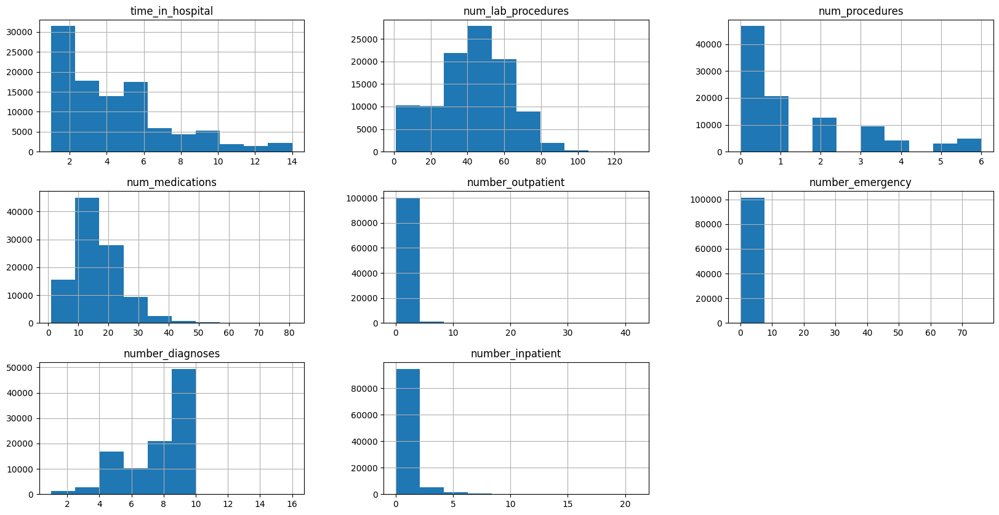

In [123]:
diabetes[numerical].hist(figsize=(20,10));

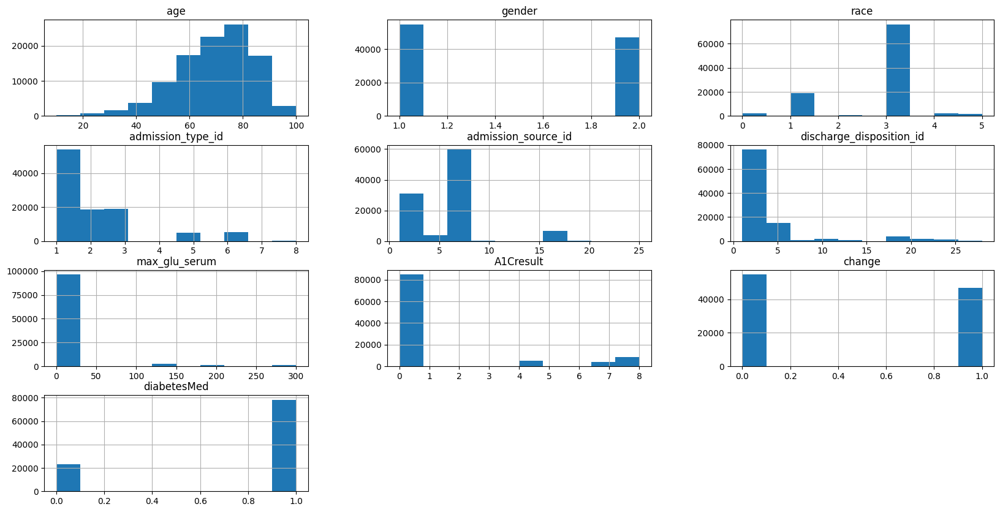

In [124]:
diabetes[categorical].hist(figsize=(20,10));

In [8]:
top_codes = diabetes['diag_1'].value_counts().head(10).index
print(top_codes)
top_codes = diabetes['diag_2'].value_counts().head(10).index
print(top_codes)
top_codes = diabetes['diag_3'].value_counts().head(10).index
print(top_codes)

Index(['Other', '428', '414', '786', '410', '486', '427', '491', '715', '682'], dtype='object')
Index(['Other', '276', '428', '250', '427', '401', '496', '599', '403', '414'], dtype='object')
Index(['Other', '250', '401', '276', '428', '427', '414', '496', '403', '585'], dtype='object')


In [136]:
# Get the top 7 readmission codes
top_codes = diabetes['diag_1'].value_counts().head(10).index
top_codes2 = diabetes['diag_2'].value_counts().head(10).index
top_codes3 = diabetes['diag_3'].value_counts().head(10).index

# Replace all codes not in the top 7 with 'Other'
diabetes.loc[~diabetes['diag_1'].isin(top_codes), 'diag_1'] = 'Other'
diabetes.loc[~diabetes['diag_2'].isin(top_codes2), 'diag_2'] = 'Other'
diabetes.loc[~diabetes['diag_3'].isin(top_codes3), 'diag_3'] = 'Other'

# showing graphs 
fig = px.histogram(diabetes, x="diag_1", title='Diag 1', width=750, height=750)
fig.show()

fig2 = px.histogram(diabetes, x="diag_2", title='Diag 2', width=750, height=750)
fig2.show()

fig3 = px.histogram(diabetes, x="diag_3", title='Diag 3', width=750, height=750)
fig3.show()

fig4 = px.histogram(diabetes, x="medical_specialty", title='medical_specialty', width=750, height=750)
fig4.show()

Similar with diagnosis codes 1,2,3 may need to group by top 5 or more and then others

## Bivariate Analysis

Performing a correlation matrix to see what variables would be appropriate for features

In [151]:
#Count the number of readmissions for each gender
readmitted_counts = diabetes2.groupby(["race", "readmitted"]).size().reset_index(name="count")

# Sort the counts in ascending order by the lower count value
# Create a stacked bar chart with gender on x-axis and readmitted as color
fig = px.bar(readmitted_counts, x="race", y="count", color="readmitted", barmode="stack")

# Set the height and width of the chart
fig.update_layout(width=600, height=600)

# Show the chart
fig.show()

We can see that there may be a bias to a specific race so we may remove this column as it may lead to bias later when picking the best variables for readmission

In [152]:
# Removing unknown/invalid from the gender column
gender_counts = diabetes2[diabetes2["gender"] != "Unknown/Invalid"]
# Count the number of readmissions for each gender
readmitted_counts = gender_counts.groupby(["gender", "readmitted"]).size().reset_index(name="count")
# Sort the counts in ascending order by the lower count value
readmitted_counts = readmitted_counts.sort_values(["gender", "count"], ascending=[False, True])
# Create a stacked bar chart with gender on x-axis and readmitted as color
fig = px.bar(readmitted_counts, x="gender", y="count", color="readmitted", barmode="stack")
# Set the height and width of the chart
fig.update_layout(width=600, height=400)
# Show the chart
fig.show()

# compute probabilities for female/male patients
female_prob_gt_30 = diabetes[(diabetes['gender'] == 1) & (diabetes['readmitted'] == 1)]['patient_nbr'].count() / diabetes[diabetes['gender'] == 1]['patient_nbr'].count()
male_prob_gt_30 = diabetes[(diabetes['gender'] == 2) & (diabetes['readmitted'] == 1)]['patient_nbr'].count() / diabetes[diabetes['gender'] == 2]['patient_nbr'].count()
# print out the results
print(f"A Female has a probability of {round(female_prob_gt_30*100, 2)}% to be readmitted within 30 days")
print(f"A Male has a probability of {round(male_prob_gt_30*100, 2)}% to be readmitted within 30 days")

A Female has a probability of 11.25% to be readmitted within 30 days
A Male has a probability of 11.06% to be readmitted within 30 days


In [153]:
age_list = {'[0-10)': 10, 
            '[10-20)': 20, 
            '[20-30)': 30, 
            '[30-40)': 40, 
            '[40-50)': 50, 
            '[50-60)': 60, 
            '[60-70)': 70, 
            '[70-80)': 80, 
            '[80-90)': 90, 
            '[90-100)': 100}
diabetes2['age'] = diabetes2['age'].map(age_list)
# Count the number of readmissions for each gender
readmitted_counts = diabetes2.groupby(["age", "readmitted"]).size().reset_index(name="count")

# Sort the counts in ascending order by the lower count value
readmitted_counts = readmitted_counts.sort_values(["age", "count"], ascending=[False, True])

# Create a stacked bar chart with gender on x-axis and readmitted as color
fig = px.bar(readmitted_counts, x="age", y="count", color="readmitted", barmode="stack")

# Set the height and width of the chart
fig.update_layout(width=600, height=400)

# Show the chart
fig.show()
# Print the results
readmitted_counts = diabetes.groupby("age")["readmitted"].value_counts(normalize=True)
print(readmitted_counts)

age  readmitted
10   0             0.981366
     1             0.018634
20   0             0.942113
     1             0.057887
30   0             0.857574
     1             0.142426
40   0             0.887682
     1             0.112318
50   0             0.893960
     1             0.106040
60   0             0.903338
     1             0.096662
70   0             0.888711
     1             0.111289
80   0             0.882260
     1             0.117740
90   0             0.879165
     1             0.120835
100  0             0.889008
     1             0.110992
Name: readmitted, dtype: float64


In [154]:
# Count the number of readmissions for each gender
readmitted_counts = diabetes2.groupby(["time_in_hospital", "readmitted"]).size().reset_index(name="count")

# Sort the counts in ascending order by the lower count value
readmitted_counts = readmitted_counts.sort_values(["time_in_hospital", "count"], ascending=[False, True])

# Create a stacked bar chart with gender on x-axis and readmitted as color
fig = px.bar(readmitted_counts, x="time_in_hospital", y="count", color="readmitted", barmode="stack")

# Set the height and width of the chart
fig.update_layout(width=600, height=400)

# Show the chart
fig.show()

In [177]:
fig = px.histogram(diabetes2, x="diag_1", color="readmitted",width=600, height=400)
fig.show()

fig2 = px.histogram(diabetes2, x="diag_2", color="readmitted",width=600, height=400)
fig2.show()

fig2 = px.histogram(diabetes2, x="diag_3", color="readmitted", width=600, height=400)
fig2.show()

In [158]:
# Count the number of readmissions for each A1Cresult
readmitted_counts = diabetes2.groupby(["A1Cresult", "readmitted"]).size().reset_index(name="count")

# Sort the counts in ascending order by the lower count value
readmitted_counts = readmitted_counts.sort_values(["A1Cresult", "count"], ascending=[False, True])

# Create a stacked bar chart with A1Cresult on x-axis and readmitted as color
fig = px.bar(readmitted_counts, x="A1Cresult", y="count", color="readmitted", barmode="stack",
             color_discrete_map={0: "red", 1: "green"})

# Set the height and width of the chart
fig.update_layout(width=500, height=600)

# Show the chart
fig.show()
prob_by_a1c = diabetes.groupby("A1Cresult")["readmitted"].value_counts(normalize=True)
# Print the results
print(prob_by_a1c)

#group as nondibetic, prediabetic, Diabetic

A1Cresult  readmitted
0          0             0.885763
           1             0.114237
4          0             0.903407
           1             0.096593
7          0             0.899528
           1             0.100472
8          0             0.901290
           1             0.098710
Name: readmitted, dtype: float64


Although many people did not get an a1c test done within the 2-3 months

In [209]:
# Count the number of readmissions for each gender
readmitted_counts = diabetes2.groupby(["change", "readmitted"]).size().reset_index(name="count")
readmitted_counts2 = diabetes2.groupby(["diabetesMed", "readmitted"]).size().reset_index(name="count")
# Sort the counts in ascending order by the lower count value
readmitted_counts = readmitted_counts.sort_values(["change", "count"], ascending=[False, True])
readmitted_counts2 = readmitted_counts2.sort_values(["diabetesMed", "count"], ascending=[False, True])
# Create a stacked bar chart with gender on x-axis and readmitted as color
fig = px.bar(readmitted_counts, x="change", y="count", color="readmitted", barmode="stack")
fig2 = px.bar(readmitted_counts2, x="diabetesMed", y="count", color="readmitted", barmode="stack")
# Set the height and width of the chart
fig.update_layout(width=600, height=400)
fig2.update_layout(width=600, height=400)
# Show the chart
fig.show()
fig2.show()

# Print the results
prob_by_change = diabetes.groupby("change")["readmitted"].value_counts(normalize=True)
print(prob_by_change)
prob_by_diabetesMed = diabetes.groupby("diabetesMed")["readmitted"].value_counts(normalize=True)
# Print the results
prob_by_diabetesMed = diabetes.groupby("diabetesMed")["readmitted"].value_counts(normalize=True)
print(prob_by_diabetesMed)


change  readmitted
0       0             0.894090
        1             0.105910
1       0             0.881767
        1             0.118233
Name: readmitted, dtype: float64
diabetesMed  readmitted
0            0             0.904025
             1             0.095975
1            0             0.883730
             1             0.116270
Name: readmitted, dtype: float64


Taking a look at weather or not changes in medication have an effect on readmission rates and if those changes were towards diabetes medication: 
* patients who had a change in medications readmit 12% of the time in <30 days
* patients who have diabetes medication were found to readmit 12% of the time in <30 days
* could mean readmission relates to changes in medication and if someone has diabetes medication on top of that

## STAT TESTING FOR BEST VARIABLES TO USE IN TERMS OF READMISSION

In [195]:
diabetes.groupby('readmitted')[categorical].mean()

,age,admission_type_id,admission_source_id,discharge_disposition_id,A1Cresult,max_glu_serum,metformin,repaglinide,glimepiride,glipizide,pioglitazone,acarbose,troglitazone,insulin,change,diabetesMed
readmitted,,,,,,,,,,,,,,,,
0,70.867199,2.029987,5.746079,3.620877,1.120224,10.034511,0.404497,0.030042,0.104451,0.250669,0.146130,0.006261,0.000033,1.049598,0.458498,0.765989
1,71.760148,1.976490,5.821168,4.468874,0.977107,11.675619,0.343136,0.037598,0.094391,0.256934,0.137272,0.005019,0.000000,1.142379,0.489390,0.802237


In [204]:
#Then use code below to read .csv
diabetes = pd.read_csv('C:/Users/Shad/.pyenv/PProjects/diabetes-analysis/data/cleandatav2.csv')
diabetes = diabetes.iloc[:, 1:]
# Select the categorical columns of interest
categorical_cols = ['age','gender', 'race', 'admission_type_id', 'admission_source_id',
               'medical_specialty', 'discharge_disposition_id', 'diag_1', 'diag_2', 'diag_3', 'max_glu_serum', 'A1Cresult', 'change', 'diabetesMed']

# Loop over each categorical column and perform chi-squared test with 'readmitted' as target
for col in categorical_cols:
    # Create a contingency table of the column and 'readmitted'
    contingency_table = pd.crosstab(diabetes[col], diabetes['readmitted'])
    # Perform the chi-squared test
    chi2, p, dof, expected = chi2_contingency(contingency_table)
    # Print the results
    print(f"Chi-squared test for {col}:")
    print(f"Chi2: {chi2:.4f}, p-value: {p:.4f}")


Chi-squared test for age:
Chi2: 116.6336, p-value: 0.0000
Chi-squared test for gender:
Chi2: 0.8419, p-value: 0.3588
Chi-squared test for race:
Chi2: 25.7626, p-value: 0.0001
Chi-squared test for admission_type_id:
Chi2: 26.6563, p-value: 0.0004
Chi-squared test for admission_source_id:
Chi2: 52.7420, p-value: 0.0000
Chi-squared test for medical_specialty:
Chi2: 345.5256, p-value: 0.0000
Chi-squared test for discharge_disposition_id:
Chi2: 1583.1143, p-value: 0.0000
Chi-squared test for diag_1:
Chi2: 1780.7980, p-value: 0.0000
Chi-squared test for diag_2:
Chi2: 1376.6220, p-value: 0.0000
Chi-squared test for diag_3:
Chi2: 1559.8001, p-value: 0.0000
Chi-squared test for max_glu_serum:
Chi2: 15.7847, p-value: 0.0013
Chi-squared test for A1Cresult:
Chi2: 35.8069, p-value: 0.0000
Chi-squared test for change:
Chi2: 38.6133, p-value: 0.0000
Chi-squared test for diabetesMed:
Chi2: 74.6563, p-value: 0.0000


In [115]:
# Select the categorical columns of interest
categorical_cols = ['metformin', 'repaglinide', 'nateglinide', 'chlorpropamide', 'glimepiride', 
               'glipizide', 'glyburide', 'tolbutamide', 'pioglitazone', 'rosiglitazone', 'acarbose', 'miglitol', 
               'troglitazone']

# Loop over each categorical column and perform chi-squared test with 'readmitted' as target
for col in categorical_cols:
    # Create a contingency table of the column and 'readmitted'
    contingency_table = pd.crosstab(diabetes[col], diabetes['readmitted'])
    # Perform the chi-squared test
    chi2, p, dof, expected = chi2_contingency(contingency_table)
    # Print the results
    print(f"Chi-squared test for {col}:")
    print(f"Chi2: {chi2:.4f}, p-value: {p:.4f}")

Chi-squared test for metformin:
Chi2: 104.8418, p-value: 0.0000
Chi-squared test for repaglinide:
Chi2: 58.9649, p-value: 0.0000
Chi-squared test for nateglinide:
Chi2: 3.4237, p-value: 0.7541
Chi-squared test for chlorpropamide:
Chi2: 8.9556, p-value: 0.1761
Chi-squared test for glimepiride:
Chi2: 16.6544, p-value: 0.0106
Chi-squared test for glipizide:
Chi2: 54.2557, p-value: 0.0000
Chi-squared test for glyburide:
Chi2: 9.9938, p-value: 0.1249
Chi-squared test for tolbutamide:
Chi2: 1.6350, p-value: 0.4415
Chi-squared test for pioglitazone:
Chi2: 29.9358, p-value: 0.0000
Chi-squared test for rosiglitazone:
Chi2: 43.0086, p-value: 0.0000
Chi-squared test for acarbose:
Chi2: 35.6837, p-value: 0.0000
Chi-squared test for miglitol:
Chi2: 11.5942, p-value: 0.0717
Chi-squared test for troglitazone:
Chi2: 1.4357, p-value: 0.4878


In [102]:
# Select the categorical columns of interest
categorical_cols = ['insulin', 'tolazamide', 'glyburide-metformin', 'glipizide-metformin', 
               'glimepiride-pioglitazone']

# Loop over each categorical column and perform chi-squared test with 'readmitted' as target
for col in categorical_cols:
    # Create a contingency table of the column and 'readmitted'
    contingency_table = pd.crosstab(diabetes[col], diabetes['readmitted'])
    # Perform the chi-squared test
    chi2, p, dof, expected = chi2_contingency(contingency_table)
    # Print the results
    print(f"Chi-squared test for {col}:")
    print(f"Chi2: {chi2:.4f}, p-value: {p:.4f}")

Chi-squared test for insulin:
Chi2: 190.7819, p-value: 0.0000
Chi-squared test for tolazamide:
Chi2: 0.5345, p-value: 0.7655
Chi-squared test for glyburide-metformin:
Chi2: 1.1893, p-value: 0.7556
Chi-squared test for glipizide-metformin:
Chi2: 0.0000, p-value: 1.0000
Chi-squared test for glimepiride-pioglitazone:
Chi2: 0.0000, p-value: 1.0000


Categorical data to keep: 
* age
* race (maybe since it is biased towards caucasins)
* admission_type_id
* admission_source_id
* medical speciality
* discharge_disposition_ids
* diag_1
* diag_2
* diag_3
* max_glu_serum
* A1Cresult
* metformin
* repaglinide
* glimepiride
* glipizide
* pioglitazone
* acarbose
* troglitazone
* insulin
* change
* diabetes med

In [194]:
categorical = ['age', 'admission_type_id', 'admission_source_id', 'medical_specialty', 'discharge_disposition_id', 
               'diag_1', 'diag_2', 'diag_3', 'A1Cresult', 'max_glu_serum',
               'metformin', 'repaglinide', 'glimepiride', 'glipizide', 'pioglitazone', 'acarbose', 'troglitazone', 'insulin', 'change', 'diabetesMed']

In [ ]:
import statsmodels.api as sm
# Select the independent variables (age and time in hospital)
X = diabetes[['age', 'time_in_hospital']]

# Add a constant to the independent variables (for intercept term in logistic regression)
X = sm.add_constant(X)

# Select the dependent variable (readmitted)
y = diabetes['readmitted']

# Fit a logistic regression model
model = sm.Logit(y, X).fit()

# Print the summary of the model
print(model.summary())

## Correlation mattrix(numerical) and heatmap (categorical) 

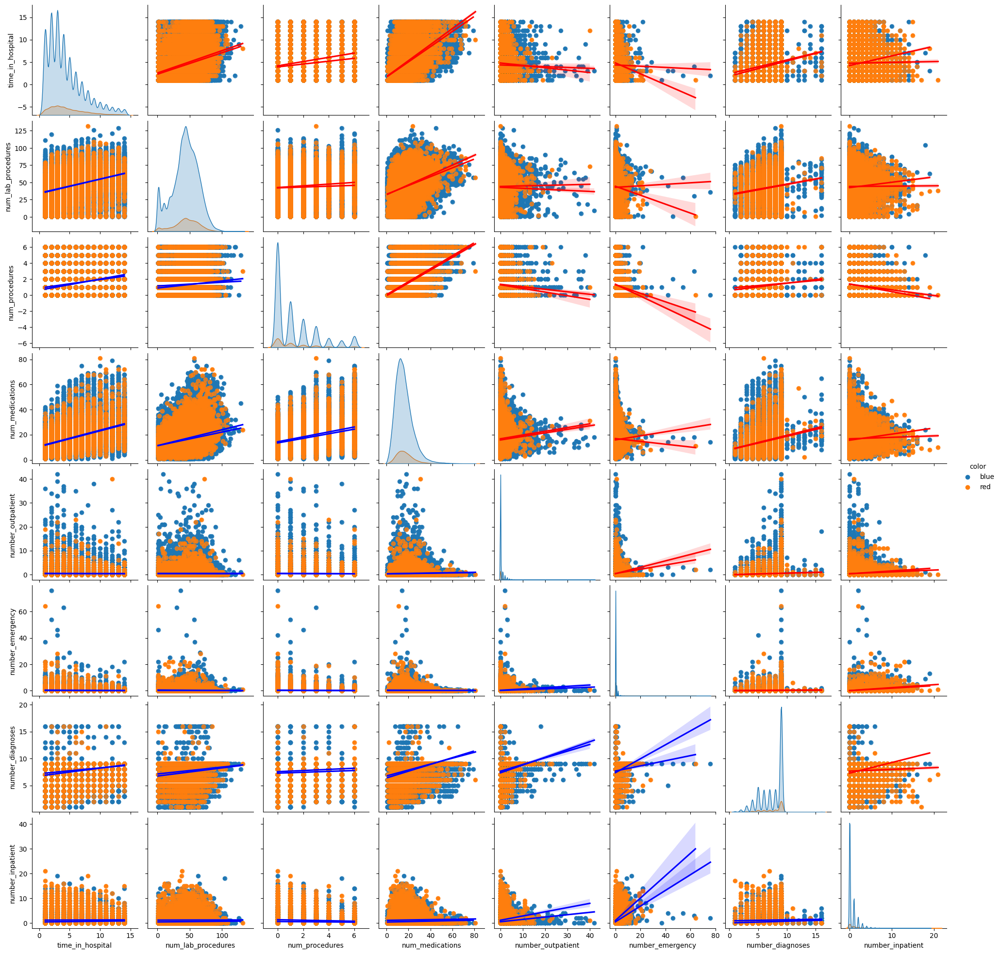

                    time_in_hospital  num_lab_procedures  num_procedures  \
time_in_hospital            1.000000            0.318429        0.191497   
num_lab_procedures          0.318429            1.000000        0.058105   
num_procedures              0.191497            0.058105        1.000000   
num_medications             0.466137            0.268176        0.385761   
number_outpatient          -0.008919           -0.007606       -0.024813   
number_emergency           -0.009683           -0.002282       -0.038175   
number_diagnoses            0.220153            0.152737        0.073769   
number_inpatient            0.073619            0.039225       -0.066226   

                    num_medications  number_outpatient  number_emergency  \
time_in_hospital           0.466137          -0.008919         -0.009683   
num_lab_procedures         0.268176          -0.007606         -0.002282   
num_procedures             0.385761          -0.024813         -0.038175   
num_medicat

In [212]:
# Select numerical variables
numerical = ['time_in_hospital', 'num_lab_procedures', 'num_procedures', 
             'num_medications', 'number_outpatient', 'number_emergency', 'number_diagnoses', 'number_inpatient']

# Map readmitted values to colors
colors = {0: 'blue', 1: 'red'}
diabetes['color'] = diabetes['readmitted'].map(colors)

# Create pair plot with color mapping
g = sns.pairplot(data=diabetes, vars=numerical, hue='color')
g.map_upper(sns.regplot, line_kws={'color': 'red'})
g.map_lower(sns.regplot, line_kws={'color': 'blue'})
plt.show()

# Print correlation coefficients
print(diabetes[numerical].corr(method='pearson'))


In [21]:
readmitted_diabetes = diabetes[diabetes['readmitted'] == 1]
corr_matrix = readmitted_diabetes[numerical].corr(method='pearson')
print(corr_matrix)

                    time_in_hospital  num_lab_procedures  num_procedures  \
time_in_hospital            1.000000            0.317655        0.256572   
num_lab_procedures          0.317655            1.000000        0.104734   
num_procedures              0.256572            0.104734        1.000000   
num_medications             0.479381            0.300945        0.396435   
number_outpatient          -0.022948            0.005296       -0.036554   
number_emergency           -0.054951           -0.046064       -0.044692   
number_diagnoses            0.182704            0.138825        0.098215   
number_inpatient            0.011970            0.004974       -0.084559   

                    num_medications  number_outpatient  number_emergency  \
time_in_hospital           0.479381          -0.022948         -0.054951   
num_lab_procedures         0.300945           0.005296         -0.046064   
num_procedures             0.396435          -0.036554         -0.044692   
num_medicat

In [22]:

readmitted_diabetes = diabetes[diabetes['readmitted'] == 0]
corr_matrix = readmitted_diabetes[numerical].corr(method='pearson')
print(corr_matrix)

                    time_in_hospital  num_lab_procedures  num_procedures  \
time_in_hospital            1.000000            0.317966        0.184436   
num_lab_procedures          0.317966            1.000000        0.052939   
num_procedures              0.184436            0.052939        1.000000   
num_medications             0.463447            0.263577        0.385402   
number_outpatient          -0.008027           -0.009679       -0.023116   
number_emergency           -0.003929            0.004752       -0.036941   
number_diagnoses            0.222743            0.153452        0.071891   
number_inpatient            0.081365            0.044138       -0.063103   

                    num_medications  number_outpatient  number_emergency  \
time_in_hospital           0.463447          -0.008027         -0.003929   
num_lab_procedures         0.263577          -0.009679          0.004752   
num_procedures             0.385402          -0.023116         -0.036941   
num_medicat

In [192]:
diabetes.groupby('readmitted')[numerical].mean()

,time_in_hospital,num_lab_procedures,num_procedures,num_medications,number_outpatient,number_emergency,number_diagnoses,number_inpatient
readmitted,,,,,,,,
0,4.349258,42.953941,1.347079,15.911123,0.360883,0.177809,7.388713,0.561666
1,4.768249,44.226028,1.280884,16.903143,0.436911,0.357313,7.692789,1.224003


In [188]:
diabetes[['time_in_hospital','num_lab_procedures','num_procedures', 'num_medications', 'number_outpatient',
          'number_emergency', 'number_diagnoses', 'number_inpatient', 'readmitted']].corr()

,time_in_hospital,num_lab_procedures,num_procedures,num_medications,number_outpatient,number_emergency,number_diagnoses,number_inpatient,readmitted
time_in_hospital,1.000000,0.318429,0.191497,0.466137,-0.008919,-0.009683,0.220153,0.073619,0.044197
num_lab_procedures,0.318429,1.000000,0.058105,0.268176,-0.007606,-0.002282,0.152737,0.039225,0.020359
num_procedures,0.191497,0.058105,1.000000,0.385761,-0.024813,-0.038175,0.073769,-0.066226,-0.012219
num_medications,0.466137,0.268176,0.385761,1.000000,0.045198,0.013180,0.261529,0.064196,0.038433
number_outpatient,-0.008919,-0.007606,-0.024813,0.045198,1.000000,0.091457,0.094148,0.107334,0.018890
number_emergency,-0.009683,-0.002282,-0.038175,0.013180,0.091457,1.000000,0.055536,0.266557,0.060744
number_diagnoses,0.220153,0.152737,0.073769,0.261529,0.094148,0.055536,1.000000,0.104703,0.049518
number_inpatient,0.073619,0.039225,-0.066226,0.064196,0.107334,0.266557,0.104703,1.000000,0.165143
readmitted,0.044197,0.020359,-0.012219,0.038433,0.018890,0.060744,0.049518,0.165143,1.000000


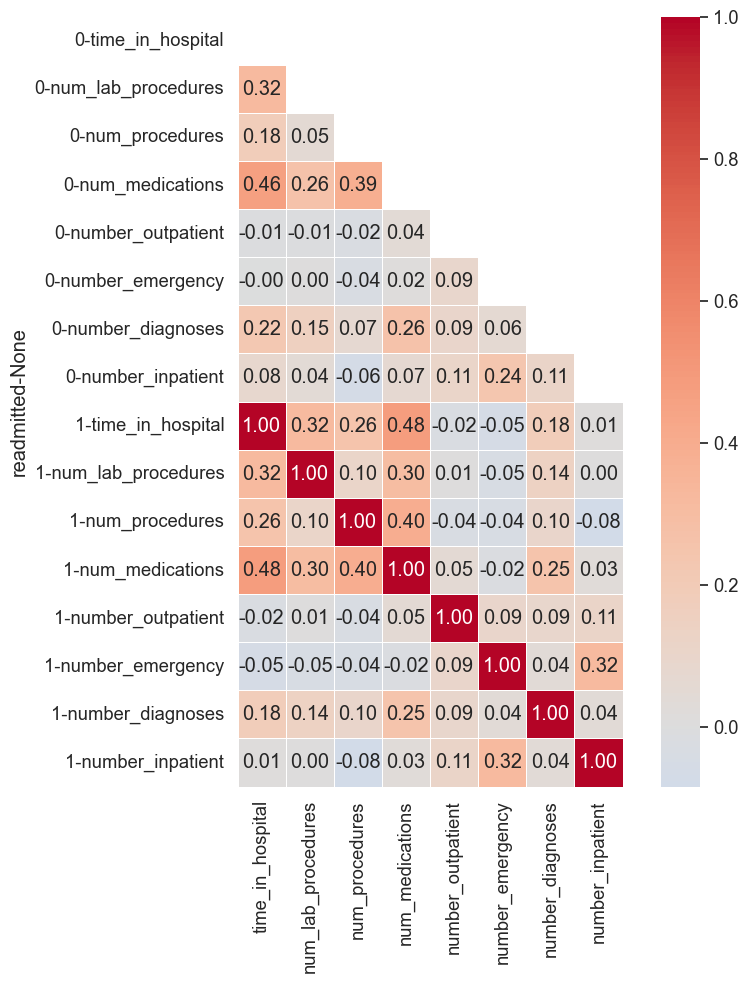

In [10]:
# calculate correlation matrix
corr_matrix = diabetes.groupby('readmitted')[numerical].corr()

# plot correlation matrix
sns.set(font_scale=1.2)
sns.set_style("white")
mask = np.zeros_like(corr_matrix)
mask[np.triu_indices_from(mask)] = True
plt.figure(figsize=(10, 10))
sns.heatmap(corr_matrix, mask=mask, annot=True, fmt=".2f", cmap='coolwarm', center=0, square=True, linewidths=0.5)
plt.show()

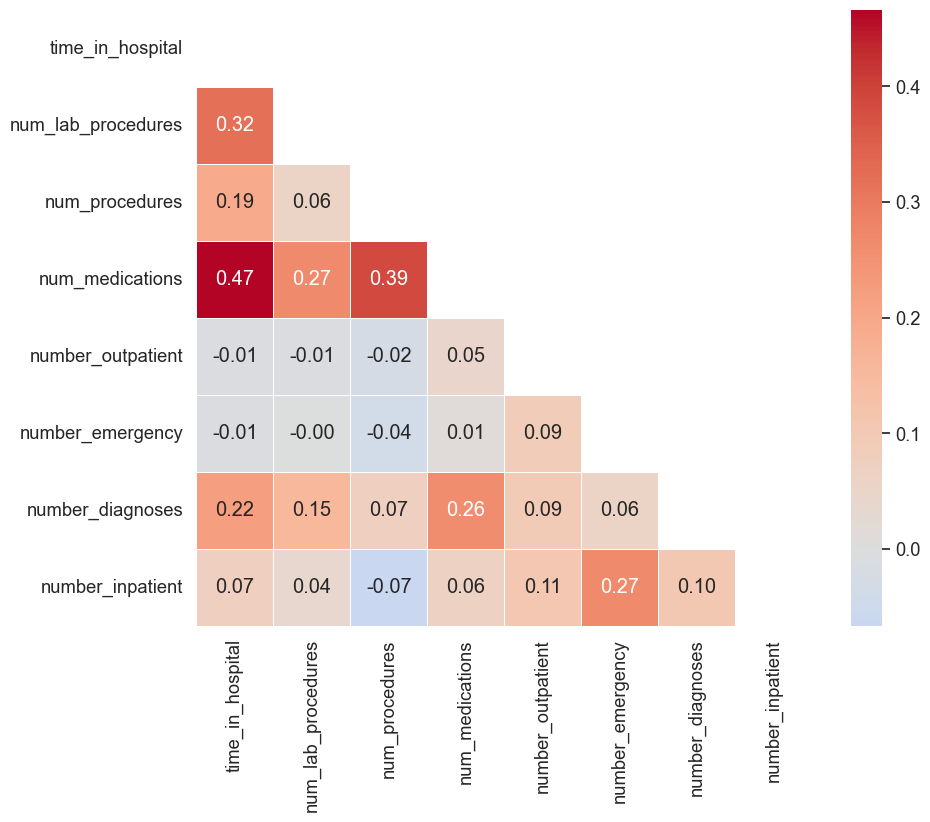

In [77]:
# calculate correlation matrix
corr_matrix = diabetes[numerical].corr()

# plot correlation matrix
sns.set(font_scale=1.2)
sns.set_style("white")
mask = np.zeros_like(corr_matrix, dtype=np.bool)
mask[np.triu_indices_from(mask)] = True
plt.figure(figsize=(10, 8))
sns.heatmap(corr_matrix, mask=mask, annot=True, fmt=".2f", cmap='coolwarm', center=0, square=True, linewidths=0.5)
plt.show()

Numerical values to keep: 
* number_inpatient-
    * number_emergency (.27)
* time_in_hospital-
    * num_medication(.47)
    * num_lab_procedure (.32)
    * number_daignoses (.22)
* num_medications-
    * num_procedures (.39)
    * num_lab_procedure (.27)
    * number_daignoses (.26)

Not to keep: 
* number of outpatient due to lack of correlation



## Feature Selection

In [166]:
from sklearn.metrics import mutual_info_score
def cat_mut_inf(series):
    return mutual_info_score(series, diabetes['readmitted'])

diabetes_cat = diabetes[numerical].apply(cat_mut_inf)
diabetes_cat = diabetes_cat.sort_values(ascending=False).to_frame(name='mutual_info_score') 
diabetes_cat

,mutual_info_score
number_inpatient,0.011038
number_emergency,0.002418
num_medications,0.001583
time_in_hospital,0.001504
number_diagnoses,0.001343
num_lab_procedures,0.000936
number_outpatient,0.000787
num_procedures,0.000234


In [167]:
from sklearn.metrics import mutual_info_score
def cat_mut_inf(series):
    return mutual_info_score(series, diabetes['readmitted'])

diabetes_cat = diabetes[categorical].apply(cat_mut_inf)
diabetes_cat = diabetes_cat.sort_values(ascending=False).to_frame(name='mutual_info_score') 
diabetes_cat

,mutual_info_score
diag_1,0.008523
diag_3,0.007618
discharge_disposition_id,0.007564
diag_2,0.007105
medical_specialty,0.001840
age,0.000625
diabetesMed,0.000379
admission_source_id,0.000269
change,0.000190
A1Cresult,0.000181


Going to include certain medications even thought all of them didnt show in the mutal info score (bc of chisqure test results): 
* metformin
* repaglinide
* glimepiride
* glipizide
* pioglitazone
* acarbose
* troglitazone
* insulin

In [202]:
### FINAL VARIABLES TO WORK WITH
categorical = ['age', 'admission_type_id', 'admission_source_id', 'medical_specialty', 'discharge_disposition_id', 
               'diag_1', 'diag_2', 'diag_3', 'A1Cresult', 'max_glu_serum',
               'metformin', 'repaglinide', 'glimepiride', 'glipizide', 
               'pioglitazone', 'acarbose', 'troglitazone',
               'insulin', 'change', 'diabetesMed']


numerical = ['time_in_hospital', 'num_lab_procedures', 'num_procedures',
             'num_medications', 'number_emergency', 'number_diagnoses', 'number_inpatient']